In [45]:
# import Pkg
using JuMP
using Printf
using Convex
using Gurobi
using LinearAlgebra
using Random
using SparseArrays
using Plots
using Ipopt
using JLD
using LIBSVM

include("proximal_bundle_method_main/src/solver.jl")
include("proximal_bundle_method_main/src/data_cleaning.jl")
include("proximal_bundle_method_main/src/PBA_utils.jl")
include("proximal_bundle_method_main/src/output_utils.jl")
include("proximal_bundle_method_main/src/computations_utils.jl")


get_sliding_min (generic function with 1 method)

# Sample size experiment

In [20]:
seed_value = 1234
name = "covtype"
reg_coeff = 0.01 #will be divided by n 
max_nb_samples =  50000
rho_coef = 1e-2
eps_optimal = 1e-5
timeout =  600 

param_set = []
run_name = "size"
for max_nb_samples in [1000,5000,10000,50000,75000,100000,125000, 150000, 175000,200000,250000]
    push!(param_set, [seed_value, name, reg_coeff, max_nb_samples, rho_coef, eps_optimal, timeout])
end

# RHO EPSILON TEST

In [32]:

seed_value = 1234
name = "covtype"
reg_coeff = 0.01 #will be divided by n 
max_nb_samples =  75000
rho_coef = 1e-2
eps_optimal = 1e-5
timeout =  180 

seeds = [1234, 5678, 91011, 121314, 151617]
# 4 CPUs per task
param_set = []
run_name = "size"
for seed_value in seeds 
    for eps_optimal in [1e-6, 1e-5, 1e-4,1e-3, 1e-2, 1e-1]
        for rho_coef in [10^(-Float64(j)) for j in (-1):7]
            push!(param_set, [seed_value, name, reg_coeff, max_nb_samples, rho_coef, eps_optimal, timeout])
        end
    end
end

# Change dataset

In [27]:
# Giselle
seed_value = 1234
name = "covtype"
reg_coeff = 0.01 #will be divided by n 
max_nb_samples =  1000000
rho_coef = 1e-2
eps_optimal = 1e-5
timeout =  60*60 

param_set = []
for name in ["colon-cancer", "duke", "leu", "ijcnn1", "skin_nonskin", "gisette_scale", "mushrooms", "covtype"]
    push!(param_set, [seed_value, name, reg_coeff, max_nb_samples, rho_coef, eps_optimal, timeout])
end

In [28]:
for params in param_set
    run_name = string(hash(params))
    save("proximal_bundle_method_main/params_files/"*run_name*".jld", "saved_params", params)
    # load("proximal_bundle_method_main/params_files/"*run_name*".jld", "saved_params")
end

In [29]:
run(`LLMapReduce --mapper map_model_rebuttal.sh --input proximal_bundle_method_main/params_files/ --output proximal_bundle_method_main/map_output_files --np=9  --slotsPerTask=16 --keep=true`)
sleep(1)
run(`LLstat`)

Your LLGrid MAP job,  26740445  has been submitted successfully...
---------------------------------------------------------------
 26740445_[1-9] | map_model_rebut | dfersztand | N/A                 | xeon-p8       | 16     | 62.50G | PENDI   |

LLGrid: TXE1 (running slurm-wlm 23.02.7)
 JOBID          | NAME            | USER       | START_TIME          | PARTITION     | CPUS   | MEM    | STATE   | NODELIST(REASON)
----------------+-----------------+------------+---------------------+---------------+--------+--------+---------+--------------------
 26728497_4     | to_benchmark_de | dfersztand | 2024-08-04T02:26:55 | xeon-g6-volta | 40     | 340.0G | RUNNI   | d-10-6-1
 26728497_3     | to_benchmark_de | dfersztand | 2024-08-04T02:25:53 | xeon-g6-volta | 40     | 340.0G | RUNNI   | d-9-8-2
 26728497_2     | to_benchmark_de | dfersztand | 2024-08-04T02:12:07 | xeon-g6-volta | 40     | 340.0G | RUNNI   | d-8-15-1
 26740445_[1-9] | map_model_rebut | dfersztand | N/A                 | xeo

Process(`LLstat`, ProcessExited(0))

In [38]:
run(`LLstat`)

LLGrid: TXE1 (running slurm-wlm 23.02.7)
 JOBID      | NAME            | USER       | START_TIME          | PARTITION     | CPUS   | MEM    | STATE   | NODELIST(REASON)
------------+-----------------+------------+---------------------+---------------+--------+--------+---------+--------------------
 26728497_4 | to_benchmark_de | dfersztand | 2024-08-04T02:26:55 | xeon-g6-volta | 40     | 340.0G | RUNNI   | d-10-6-1
 26728497_3 | to_benchmark_de | dfersztand | 2024-08-04T02:25:53 | xeon-g6-volta | 40     | 340.0G | RUNNI   | d-9-8-2
 26728497_2 | to_benchmark_de | dfersztand | 2024-08-04T02:12:07 | xeon-g6-volta | 40     | 340.0G | RUNNI   | d-8-15-1
 26740445_1 | map_model_rebut | dfersztand | 2024-08-05T09:31:08 | xeon-p8       | 16     | 62.50G | RUNNI   | d-5-5-2
 26740445_2 | map_model_rebut | dfersztand | 2024-08-05T09:31:08 | xeon-p8       | 16     | 62.50G | RUNNI   | d-5-5-2
 26740445_3 | map_model_rebut | dfersztand | 2024-08-05T09:31:08 | xeon-p8       | 16     | 62.50G | RU

Process(`LLstat`, ProcessExited(0))

In [299]:
# run(`LLkill 26736215`)

# Rho vs Epsilon

In [140]:
# RHO EPSILON TEST
seed_value = 1234
name = "covtype"
reg_coeff = 0.01 #will be divided by n 
max_nb_samples =  50000
rho_coef = 1e-2
eps_optimal = 1e-5
timeout =  300 

param_set = []
run_name = "size"
rho_coef_list =  [10^(-j) for j in -1:0.5:5]
epsilon_list = [1e-6, 1e-5, 1e-4,1e-3, 1e-2, 1e-1]
for eps_optimal in epsilon_list
    for rho_coef in rho_coef_list
        push!(param_set, [seed_value, name, reg_coeff, max_nb_samples, rho_coef, eps_optimal, timeout])
    end
end


In [58]:
# V2
seed_value = 1234
name = "covtype"
reg_coeff = 0.01 #will be divided by n 
max_nb_samples =  75000
rho_coef = 1e-2
eps_optimal = 1e-5
timeout =  180 

seeds = [1234, 5678, 91011, 121314, 151617]

rho_coef_list =  [10^(-Float64(j)) for j in (-1):7]
epsilon_list = [1e-6, 1e-5, 1e-4,1e-3, 1e-2, 1e-1]

# 4 CPUs per task
param_set = []
run_name = "size"
for seed_value in seeds 
    for eps_optimal in [1e-6, 1e-5, 1e-4,1e-3, 1e-2, 1e-1]
        for rho_coef in [10^(-Float64(j)) for j in (-1):7]
            push!(param_set, [seed_value, name, reg_coeff, max_nb_samples, rho_coef, eps_optimal, timeout])
        end
    end
end

In [59]:
# i=0
dic_iter= Dict()
for params in param_set
        run_name = string(hash(params))
        loaded_data = load("proximal_bundle_method_main/map_output_files/"*run_name*".jld")
        dic_bundle_size, dic_gaps, dic_times,dic_runtimes_bundle,  dic_has_timeout_bundle, list_iter_index_pegasos, list_obj_value_gap_pegasos, list_times_pegasos,has_timeout_pegasos, sol_subgradient = loaded_data["saved_output"]
        dic_temp = make_dic_nb_iter(dic_gaps, dic_has_timeout_bundle, list_iter_index_pegasos,has_timeout_pegasos, sol_subgradient)
        if !haskey(dic_iter, (params[5], params[6]))
            dic_iter[(params[5], params[6])] = [Float64(dic_temp[Keep_active])]
        else
        # println(Float64(dic_temp[Keep_active]))
            push!(dic_iter[(params[5], params[6])], Float64(dic_temp[Keep_active]))
        end
end   
# i, length(param_set)

In [60]:
using Statistics
dic_iter = Dict(k => mean(dic_iter[k]) for k in keys(dic_iter));

In [61]:
a = Dict()
for params in param_set
    run_name = string(hash(params))
    loaded_data = load("proximal_bundle_method_main/map_output_files/"*run_name*".jld")
    dic_bundle_size, dic_gaps, dic_times,dic_runtimes_bundle,  dic_has_timeout_bundle, list_iter_index_pegasos, list_obj_value_gap_pegasos, list_times_pegasos,has_timeout_pegasos, sol_subgradient = loaded_data["saved_output"]
    a[(params[5], params[6])] = make_dic_runtime(dic_runtimes_bundle, dic_has_timeout_bundle, list_times_pegasos,has_timeout_pegasos, sol_subgradient)
    a[(params[5], params[6])] =a[(params[5], params[6])][Keep_active]
end

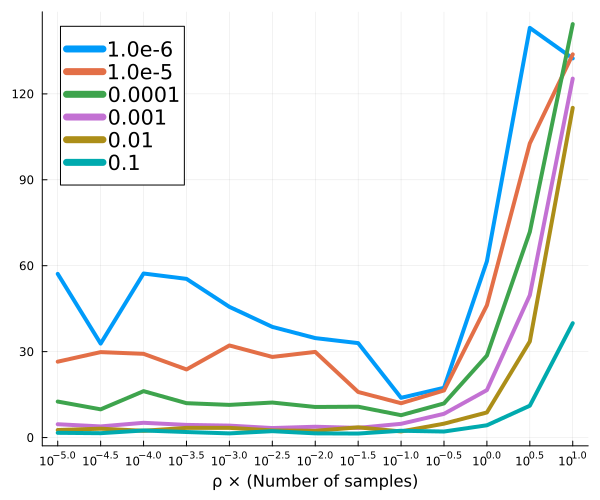

In [149]:
a
p = plot(size = (600,500), legend = :topleft)

for e in epsilon_list
    # plot!(rho_coef_list, [a[(r, e)]/a[(rho_coef_list[end], e)] for r in rho_coef_list], label = string(e),linewidth=4)
    plot!(rho_coef_list, [a[(r, e)] for r in rho_coef_list], label = string(e),linewidth=4)

end
# ylabel!("Time (normalized for each accuracy)")
xlabel!("rho")

plot!(legendfontsize=14)
xlabel!("ρ × (Number of samples)")
# ylims!(0,3)

plot!(xaxis = :log)
xticks!(rho_coef_list, [log10(r) == floor(log10(r)) ?  "1e"*string((log10(r/max_nb_samples))) : "" for r in rho_coef_list ])

plot!()

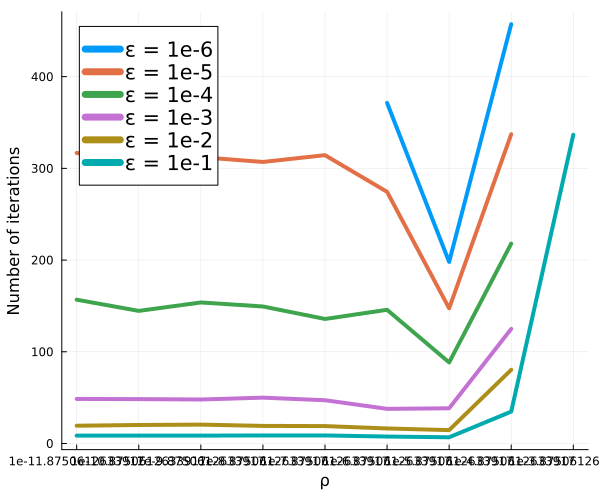

In [62]:
dic_iter
p = plot(size = (600,500), legend=:topleft)

for e in epsilon_list
    plot!(rho_coef_list, [dic_iter[(r, e)] for r in rho_coef_list], label = "ε = 1e"*string(Int(log10(e))),linewidth=4)
end
plot!(legendfontsize=14)
ylabel!("Number of iterations")
xlabel!("ρ")

plot!(xaxis = :log)
xticks!(rho_coef_list, [log10(r) == floor(log10(r)) ?  "1e"*string((log10(r/max_nb_samples))) : "" for r in rho_coef_list ])
# savefig(p, "proximal_bundle_method_main/outputs/rho_vs_epsilon.pdf") 

plot!()

# Sample size

In [49]:
seed_value = 1234
name = "covtype"
reg_coeff = 0.01 #will be divided by n 
max_nb_samples =  50000
rho_coef = 1e-2
eps_optimal = 1e-5
timeout =  600 

param_set = []
run_name = "size"
max_nb_sample_list = [1000,5000,10000,50000,75000,100000,125000, 150000, 175000,200000,250000]
for max_nb_samples in max_nb_sample_list
    push!(param_set, [seed_value, name, reg_coeff, max_nb_samples, rho_coef, eps_optimal, timeout])
end

In [50]:
params = param_set
i=0
methods = []
dic_runtime_all = Dict() 
for params in param_set
    run_name = string(hash(params))
    loaded_data = load("proximal_bundle_method_main/map_output_files/"*run_name*".jld")
    dic_bundle_size, dic_gaps, dic_times,dic_runtimes_bundle,  dic_has_timeout_bundle, list_iter_index_pegasos, list_obj_value_gap_pegasos, list_times_pegasos,has_timeout_pegasos, sol_subgradient = loaded_data["saved_output"]
    dic_runtime_all[params[4]]  = make_dic_runtime(dic_runtimes_bundle, dic_has_timeout_bundle, list_times_pegasos,has_timeout_pegasos, sol_subgradient)
    i +=1
    methods = keys(dic_runtime_all[params[4]])
    println(i)
end    
i, length(param_set)

1
2
3
4
5
6
7
8
9
10
11


(11, 11)

In [51]:
dic_runtime_by_method = Dict()
for method in methods
    dic_runtime_by_method[method] = [dic_runtime_all[n][method] for n in max_nb_sample_list]
end
dic_runtime_by_method

Dict{Any, Any} with 5 entries:
  Keep_all              => [0.0207231, 0.410047, 0.717502, 21.5894, 43.2949, 57…
  Keep_active_null_step => [0.030051, 0.387882, 1.36211, 38.5641, 94.2516, 119.…
  Keep_active           => [0.780714, 1.35497, 1.62398, 16.8264, 39.3271, 61.99…
  "Pegasos"             => [0.474041, 1.28543, 2.20498, 16.075, 55.2598, 99.054…
  "Subgradient"         => [0.0738239, 0.603641, 4.48487, 240.717, Inf, Inf, In…

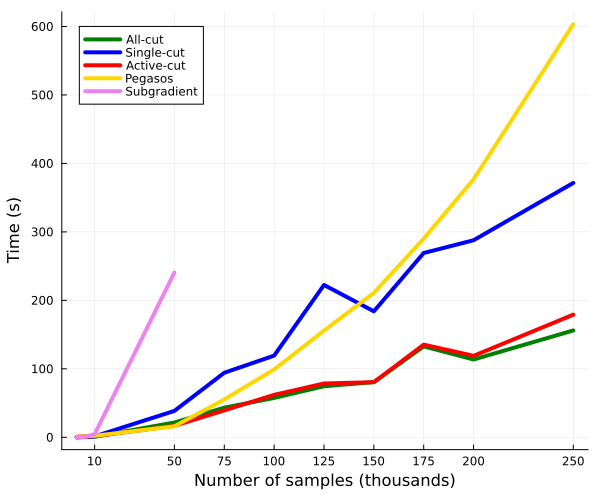

In [52]:
p = plot(size = (600,500))

for method in keys(dic_runtime_by_method)
    plot!(max_nb_sample_list, dic_runtime_by_method[method], label = dic_names_method[method], color = color_dic[method],linewidth=4)
end
ylabel!("Time (s)")
xlabel!("Number of samples (thousands)")
xticks!(max_nb_sample_list[3:end], string.(Int.(max_nb_sample_list[3:end]./1000)))
# savefig(p, "proximal_bundle_method_main/outputs/runtime_by_sample_size"*".pdf") 
plot!()

# Several datasets

In [49]:
seed_value = 1234
name = "covtype"
reg_coeff = 0.01 #will be divided by n 
max_nb_samples =  1000000
rho_coef = 1e-2
eps_optimal = 1e-5
timeout =  60*60 

param_set = []
for name in ["colon-cancer", "duke", "leu", "ijcnn1", "skin_nonskin", "gisette_scale", "mushrooms", "gisette_scale", "covtype"]
    push!(param_set, [seed_value, name, reg_coeff, max_nb_samples, rho_coef, eps_optimal, timeout])
end

In [50]:
dic_data = Dict()
dic_iters = Dict()
i=0
for params in param_set
    
        run_name = string(hash(params))
        
        try    
        loaded_data = load("proximal_bundle_method_main/map_output_files/"*run_name*".jld")
        i +=1

        dic_bundle_size, dic_gaps, dic_times,dic_runtimes_bundle,  dic_has_timeout_bundle, list_iter_index_pegasos, list_obj_value_gap_pegasos, list_times_pegasos,has_timeout_pegasos, sol_subgradient = loaded_data["saved_output"]
        dic_data[params[2]]  = make_dic_runtime(dic_runtimes_bundle, dic_has_timeout_bundle, list_times_pegasos,has_timeout_pegasos, sol_subgradient)
        dic_iters[params[2]] = make_dic_nb_iter(dic_gaps, dic_has_timeout_bundle, list_iter_index_pegasos,has_timeout_pegasos, sol_subgradient)
    catch
        end
        println(i)
end    
i, length(param_set)

1
2
3
4
5
6
7
8
9


(9, 9)

In [56]:
function pretty_print_dict(d::Dict, indent::Int=0)
    for (key, value) in d
        println(" "^indent * "$key: ")
        if isa(value, Dict)
            pretty_print_dict(value, indent + 4)
        else
            println(" "^(indent + 4) * "$value")
        end
    end
end
pretty_print_dict(dic_data);
# pretty_print_dict(dic_iters)

ijcnn1: 
    Keep_all: 
        1.873924970626831
    Keep_active_null_step: 
        2.6057190895080566
    Keep_active: 
        2.3493378162384033
    Pegasos: 
        3.657993793487549
    Subgradient: 
        2.4498229026794434
mushrooms: 
    Keep_all: 
        12.755885124206543
    Keep_active_null_step: 
        1.8455560207366943
    Keep_active: 
        2.5055320262908936
    Pegasos: 
        11.808096170425415
    Subgradient: 
        2.424226999282837
covtype: 
    Keep_all: 
        416.01520705223083
    Keep_active_null_step: 
        1133.6106469631195
    Keep_active: 
        434.65421414375305
    Pegasos: 
        2030.8823878765106
    Subgradient: 
        Inf
colon-cancer: 
    Keep_all: 
        6.241484880447388
    Keep_active_null_step: 
        19.07359504699707
    Keep_active: 
        10.72342300415039
    Pegasos: 
        25.534911155700684
    Subgradient: 
        5.7265050411224365
skin_nonskin: 
    Keep_all: 
        1.216850996017456
    Kee

# Single plot

In [68]:
seed_value = 1234
name = "gisette_scale"
reg_coeff = 0.01 #will be divided by n 
max_nb_samples =  1000000
rho_coef = 1e-2
eps_optimal = 1e-5
timeout =  60*60 
manage_bundle_values = [Keep_active_null_step, Keep_active, Keep_all]


params  =[seed_value, name, reg_coeff, max_nb_samples, rho_coef, eps_optimal, timeout]
run_name = run_name = string(hash(params))
loaded_data = load("proximal_bundle_method_main/map_output_files/"*run_name*".jld")
dic_bundle_size, dic_gaps, dic_times,dic_runtimes_bundle,  dic_has_timeout_bundle, list_iter_index_pegasos, list_obj_value_gap_pegasos, list_times_pegasos,has_timeout_pegasos, sol_subgradient = loaded_data["saved_output"];
  

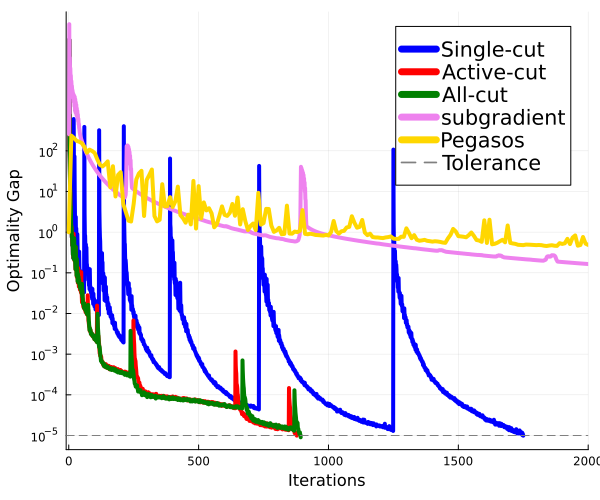

In [69]:
p = plot(size = (600,500))
for manage_bundle in manage_bundle_values
    # plot!(dic_gaps[manage_bundle], label = "", color = color_dic[manage_bundle],linewidth=4)
    plot!(dic_gaps[manage_bundle], label = dic_names_method[manage_bundle], color = color_dic[manage_bundle],linewidth=4)
end
plot!([s.objective for s in sol_subgradient.iteration_stats], label = "subgradient", linewidth = 4, color = "violet")
plot!(list_iter_index_pegasos, list_obj_value_gap_pegasos, label = "Pegasos", linewidth = 4, color = "gold")

hline!([eps_optimal], linestyle=:dash, label="Tolerance", color = "grey")
xlabel!("Iterations")
ylabel!("Optimality Gap")
plot!(legendfontsize=14)
# y_ticks = range(1e-4, stop=1e1, length=20)
# title!("Progress for different bundle management strategies")
plot!(yaxis=:log, yticks = [1e-5, 1e-4, 1e-3, 1e-2,1e-1, 1, 10, 100])
# ylims!(1e-5, 100)
xlims!(-10, 2000)
# savefig(p, "Optimality_gap.pdf") 
# savefig(p, "proximal_bundle_method_main/outputs/Optimality_gap_by_iteration_"*name*"_"*string(coeff)*"_"*string(max_nb_samples)*"_rho_"*string(rho)*".pdf") 
# savefig(p, "proximal_bundle_method_main/outputs/Optimality_gap_by_iteration_"*string(max_nb_samples)*".pdf") 
plot!()

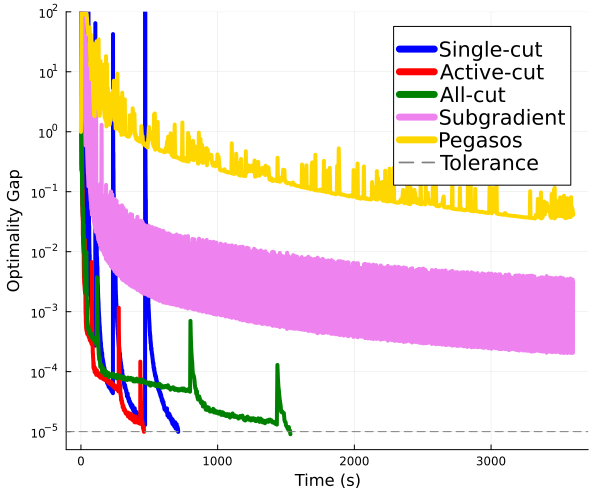

In [70]:
p = plot(size = (600,500))
for manage_bundle in manage_bundle_values
    # plot!(dic_gaps[manage_bundle], label = "", color = color_dic[manage_bundle],linewidth=4)
    plot!(dic_times[manage_bundle],dic_gaps[manage_bundle], label = dic_names_method[manage_bundle], color = color_dic[manage_bundle],linewidth=4)
end
plot!([s.time - sol_subgradient.iteration_stats[1].time for s in sol_subgradient.iteration_stats], ([s.objective for s in sol_subgradient.iteration_stats]), label = "Subgradient", linewidth = 4, color = "violet")
plot!(list_times_pegasos, list_obj_value_gap_pegasos, label = "Pegasos", linewidth = 4, color = "gold")

hline!([eps_optimal], linestyle=:dash, label="Tolerance", color = "grey")
xlabel!("Time (s)")
ylabel!("Optimality Gap")
plot!(legendfontsize=14)
# y_ticks = range(1e-4, stop=1e1, length=20)
# title!("Progress for different bundle management strategies")
plot!(yaxis=:log, yticks = [1e-5, 1e-4, 1e-3, 1e-2,1e-1, 1, 10, 100])
ylims!(eps_optimal/2, 100)
# savefig(p, "proximal_bundle_method_main/outputs/Optimality_gap_by_time_"*string(max_nb_samples)*".pdf") 
# xlims!(-0.1, 1000)
plot!()

# Dual method

In [3]:
Random.seed!(2625)
instance_names = ["mushrooms","colon-cancer", "duke", "leu", "gisette_scale", "skin_nonskin", "ijcnn1","covtype"]
reg_coeff = 0.01 #will be divided by n 
eps_optimal = 1e-5

instances_ = Dict()
for name in instance_names
    instances_[name] = preprocess_learning_data(load_libsvm_file("proximal_bundle_method_main/data/" * name))
    samples, features  = size(instances_[name].feature_matrix)
    println(name* " --- number of features = "*string(features)*" || number of samples = "*string(samples))
end
instances_ = nothing 

colon-cancer --- number of features = 2001 || number of samples = 62
duke --- number of features = 7130 || number of samples = 44
leu --- number of features = 7130 || number of samples = 38
gisette_scale --- number of features = 4956 || number of samples = 6000
ijcnn1 --- number of features = 23 || number of samples = 49990
skin_nonskin --- number of features = 4 || number of samples = 245057
covtype --- number of features = 55 || number of samples = 581012


In [46]:
instance_names = ["mushrooms","colon-cancer", "duke", "leu", "gisette_scale", "skin_nonskin", "ijcnn1","covtype"]

1-element Vector{String}:
 "mushrooms"

In [47]:
for name in instance_names 
    instances_ = Dict()
    instances_[name] = preprocess_learning_data(load_libsvm_file("proximal_bundle_method_main/data/" * name))
    samples, features  = size(instances_[name].feature_matrix)
    println(name* " --- number of features = "*string(features)*" || number of samples = "*string(samples))
    max_nb_samples = Inf
    # name = "covtype"
    # name = "covtype" #this works well
    instance = instances_[name]
    Xp = (instance.feature_matrix)
    y = instance.labels
    try
        # Determine the number of samples to draw
        nb_samples = min(max_nb_samples, size(Xp, 1))

        # Generate a random permutation of indices
        indices = randperm(size(Xp, 1))[1:nb_samples]

        # Select the samples using the random indices
        Xp = Xp[indices, :]
        y = y[indices]
    catch
        # Handle any potential errors
    end

    n, m = size(Xp)

    x_init = randn(m) / m
    coefficients = [0.01/n]
    coeff = coefficients[1]
    print("\n------------------------------------\n")
    # Printf.@printf("Instance %s, coeff %12g\n", name, coeff)
    # println("Solving with Convex.jl first")
    # opt_val = compute_minimum_with_jump(Xp, y, coeff)
    # Printf.@printf("Obj=%12g\n", opt_val,)
    println(name)
    
    ti = time()
    println(ti)
    flush(stdout)
    @time model = svmtrain(transpose(Xp),y, kernel = Kernel.Linear, cost = 1/coeff, tolerance = eps_optimal, verbose = false);
    println("time = ",time()-ti, " s")
end

mushrooms --- number of features = 113 || number of samples = 8124

------------------------------------
mushrooms
1.722865508118039e9
  1.101468 seconds (724.67 k allocations: 62.401 MiB, 49.44% compilation time)
time = 1.1156032085418701 s
